In [35]:
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
import numpy as np
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
import seaborn as sns
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics


In [36]:

filename = 'outfile.csv'
data = pd.read_csv(filename, sep=',', comment='#', na_values=[""], error_bad_lines=False)
raw_data = pd.read_csv(filename, sep=',', comment='#', na_values=[""], error_bad_lines=False)
pd.set_option('display.max_rows', data.shape[0]+1)
print(data.columns)
data = data.dropna()

print(data)

010   475000.0   145000.0             0  ...    0.39   
35   5000000.0   5000000  1000000.0    50000.0             0  ...    0.08   
36    633460.0    633460   205000.0    42500.0             0  ...    0.11   
37   3619775.0   3619775        0.0        0.0             0  ...    0.24   
38    435689.0    435689   380000.0    30000.0             0  ...    0.07   
39   1830000.0   1830000  1441668.0        0.0             0  ...    0.17   
41   3500000.0   3500000   750000.0   650000.0             0  ...    0.07   
42   4700000.0   4700000  2875000.0   600000.0             0  ...    0.13   
43   1701109.0   1701109  2000000.0        0.0             0  ...    0.12   
44   3500000.0   3500000   580000.0    50000.0             0  ...    0.10   
45   4000000.0   4013600  3100000.0   300000.0             0  ...    0.15   
46   3980434.0   3980434  1472917.0   869917.0             0  ...    0.21   
47    800000.0    805850   400000.0        0.0             0  ...    0.20   
48    850000.0    85

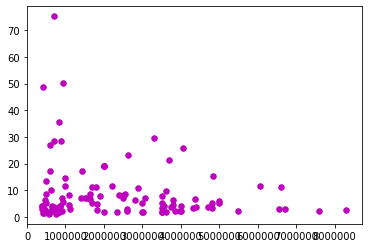

In [37]:
x = data['TotalPay']
y = data['PCT_BLACK']
plt.scatter(x, y, color = "m", marker = "o", s = 30)
plt.show()

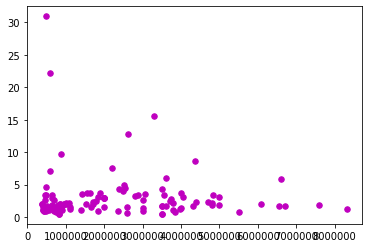

In [38]:
x = data['TotalPay']
y = data['PCT_WHITE']
plt.scatter(x, y, color = "m", marker = "o", s = 30)
plt.show()

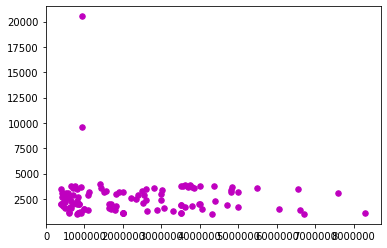

In [39]:
x = data['TotalPay']
y = data['FGR']
plt.scatter(x, y, color = "m", marker = "o", s = 30)
plt.show()

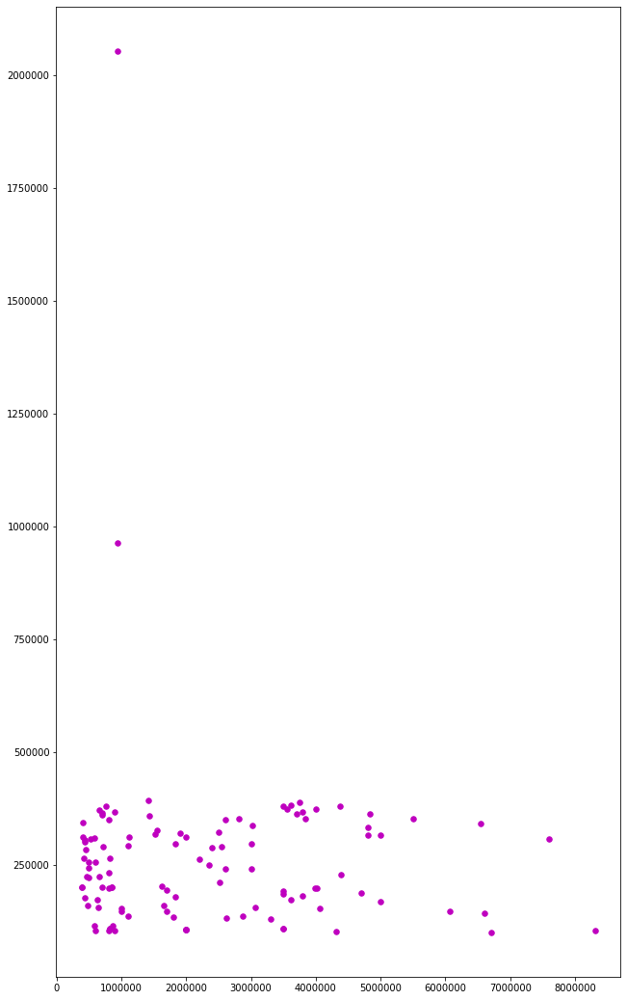

In [40]:
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(10.5, 18.5, forward=True)
x = data['TotalPay']
y = data['GSR']
plt.scatter(x, y, color = "m", marker = "o", s = 30)
plt.show()

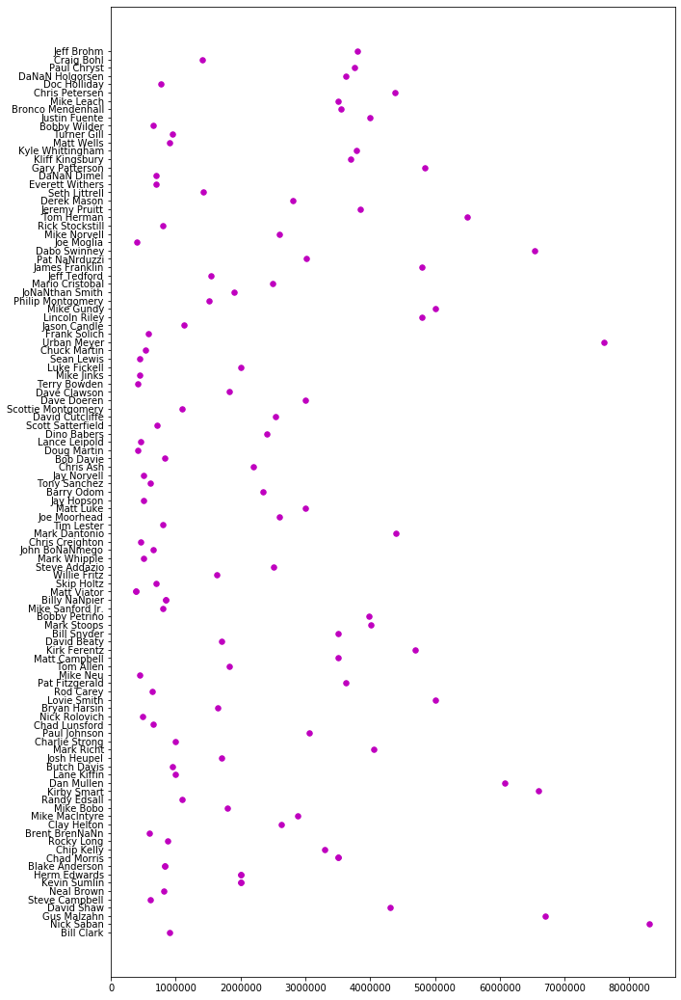

In [41]:
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(10.5, 18.5, forward=True)
x = data['TotalPay']
y = data['Coach']
plt.scatter(x, y, color = "m", marker = "o", s = 30)
plt.show()

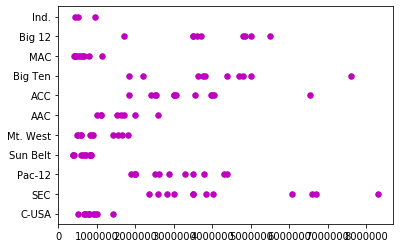

In [42]:
x = data['TotalPay']
y = data['Conference']
plt.scatter(x, y, color = "m", marker = "o", s = 30)
plt.show()

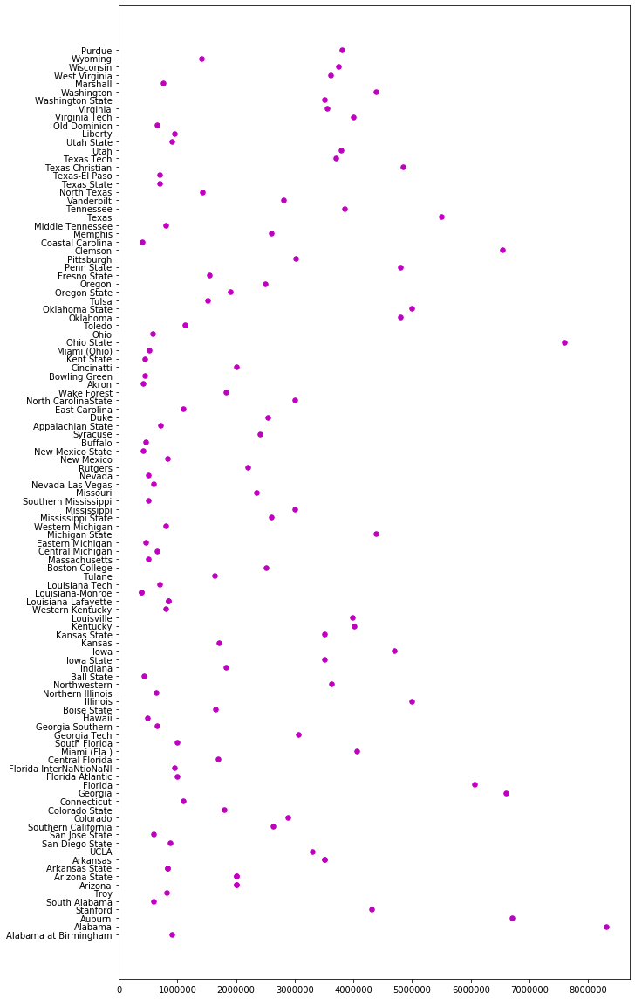

In [43]:
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(10.5, 20.5, forward=True)
x = data['TotalPay']
y = data['School']
plt.scatter(x, y, color = "m", marker = "o", s = 30)
plt.show()

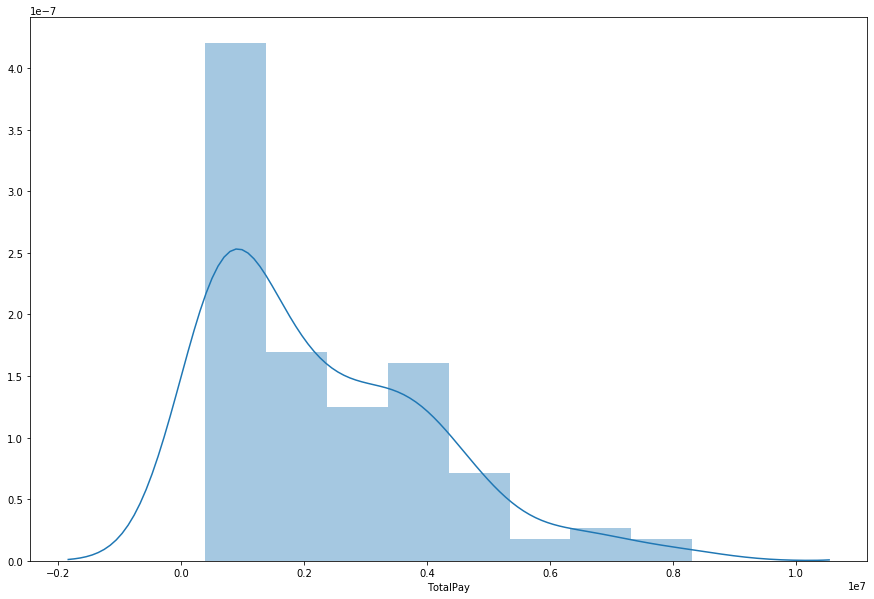

In [44]:
plt.figure(figsize=(15,10))
plt.tight_layout()
sns.distplot(data['TotalPay'])
plt.show()

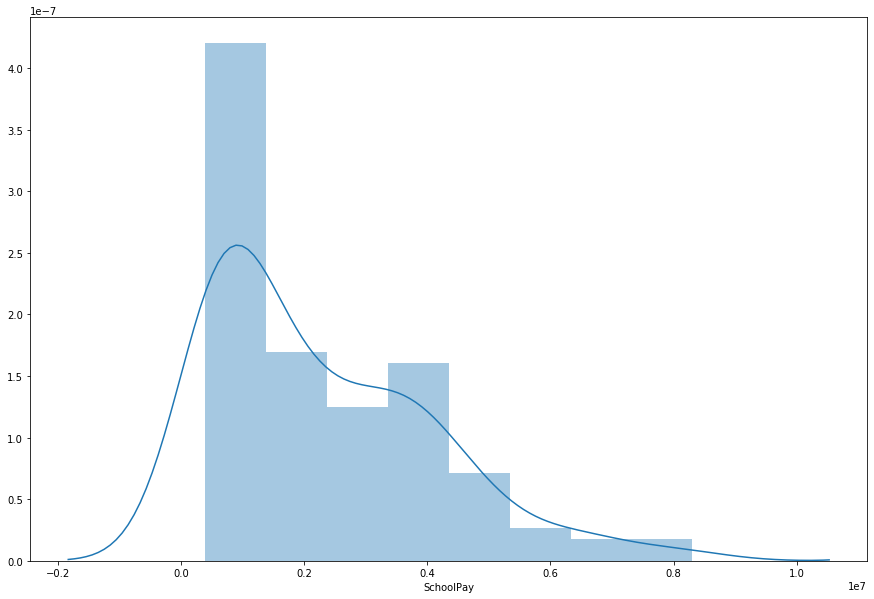

In [45]:
plt.figure(figsize=(15,10))
plt.tight_layout()
sns.distplot(data['SchoolPay'])
plt.show()

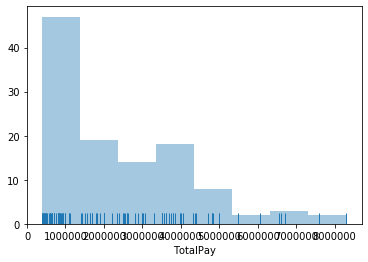

In [46]:
sns.distplot(data['TotalPay'], kde=False, rug=True);

In [47]:
data.describe()

,record,ID,SchoolPay,TotalPay,Bonus,BonusPaid,AssistantPay,Buyout,NaNME.IN.FILE,OTHER.FULL.NaNME,...,OPEID6,COUNT_ED,AGEGE24,PCT_WHITE,PCT_BLACK,PCT_ASIAN,PCT_HISPANIC,PCT_BA,PCT_GRAD_PROF,PCT_BORN_US
count,113.000000,113.000000,1.130000e+02,1.130000e+02,1.130000e+02,1.130000e+02,113.0,1.130000e+02,113.000000,113.000000,...,113.000000,113.000000,113.000000,113.000000,113.000000,113.000000,113.000000,113.000000,113.000000,113.000000
mean,66.061947,174432.637168,2.278384e+06,2.289402e+06,7.733413e+05,1.115986e+05,0.0,6.234176e+06,42297.247788,73.309735,...,0.179646,78.890443,11.726283,3.007699,8.735841,16.839734,9.570177,90.891770,63454.264425,8.589912
std,40.447559,43610.497077,1.799759e+06,1.804407e+06,7.108697e+05,2.209009e+05,0.0,8.356727e+06,23229.367843,9.817149,...,0.095112,10.588202,9.866468,3.940263,11.044057,3.573025,2.527504,7.462510,10785.245887,3.280249
min,1.000000,100663.000000,3.900000e+05,3.900000e+05,0.000000e+00,0.000000e+00,0.0,0.000000e+00,2500.000000,50.000000,...,0.000000,34.380001,0.820000,0.490000,1.100000,9.410000,5.100000,52.110001,34674.560000,4.520000
25%,31.000000,139755.000000,8.000000e+05,8.000000e+05,2.500000e+05,0.000000e+00,0.0,6.885000e+05,25000.000000,68.000000,...,0.100000,73.529999,5.030000,1.370000,2.680000,14.330000,7.760000,88.349998,57504.740000,6.510000
50%,65.000000,176044.000000,1.701109e+06,1.830000e+06,6.250000e+05,2.500000e+04,0.0,2.671875e+06,40000.000000,73.000000,...,0.160000,80.519997,8.140000,2.010000,4.830000,17.030001,9.210000,93.430000,63066.250000,7.660000
75%,99.000000,209551.000000,3.500000e+06,3.500000e+06,1.050000e+06,1.250000e+05,0.0,8.166667e+06,57400.000000,79.000000,...,0.250000,87.300003,14.700000,3.230000,9.860000,19.190001,10.790000,95.739998,70891.420000,9.590000
max,137.000000,243780.000000,8.307000e+06,8.307000e+06,3.100000e+06,1.350000e+06,0.0,3.805840e+07,106572.000000,99.000000,...,0.580000,93.129997,63.220001,30.940001,75.300003,26.480000,17.160000,98.040001,88589.140000,25.219999


In [48]:
import statsmodels.formula.api as smf
results = smf.ols('TotalPay ~ Conference + GSR ', data=data).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               TotalPay   R-squared:                       0.704
Model:                            OLS   Adj. R-squared:                  0.672
Method:                 Least Squares   F-statistic:                     21.81
Date:                Fri, 24 Jan 2020   Prob (F-statistic):           4.97e-22
Time:                        20:56:52   Log-Likelihood:                -1718.9
No. Observations:                 113   AIC:                             3462.
Df Residuals:                     101   BIC:                             3495.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept               1.504e+06   3.89e+05      3.863      0.000    7.32e+05    2.28e+06
Conference[T.ACC]       1.781e+06   4.73e+05      3.770      0.000    8.44e+05    2.72e+06
Conference[T.Big 12]    2.418e+06   5.04e+05      4.803      0.000    1.42e+06    3.42e+06
Conference[T.Big Ten]   2.587e+06   4.91e+05      5.274      0.000    1.61e+06    3.56e+06
Conference[T.C-USA]    -7.762e+05   4.84e+05     -1.605      0.112   -1.74e+06    1.83e+05
Conference[T.Ind.]     -1.155e+06   7.78e+05     -1.485      0.141    -2.7e+06    3.88e+05
Conference[T.MAC]      -1.009e+06   4.72e+05     -2.137      0.035   -1.95e+06   -7.23e+04
Conference[T.Mt. West] -5.619e+05   4.81e+05     -1.169      0.245   -1.52e+06    3.91e+05
Conference[T.Pac-12]    1.289e+06   4.65e+05      2.772      0.007    3.66e+05    2.21e+06
Conference[T.SEC]       2.875e+06   4.73e+05      6.083      0.000    1.94e+06    3.81e+06
Conference[T.Sun Belt] -9.012e+05   4.73e+05     -1.907      0.059   -1.84e+06    3.63e+04
GSR                        0.3229      0.557      0.579      0.564      -0.783       1.428
==============================================================================
Omnibus:                       30.392   Durbin-Watson:                   1.560
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               75.494
Skew:                           0.993   Prob(JB):                     4.04e-17
Kurtosis:                       6.477   Cond. No.                     4.33e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.33e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [49]:
import statsmodels.formula.api as smf
results = smf.ols('TotalPay ~ Conference + GSR + Bonus + BonusPaid  ', data=data).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               TotalPay   R-squared:                       0.776
Model:                            OLS   Adj. R-squared:                  0.747
Method:                 Least Squares   F-statistic:                     26.45
Date:                Fri, 24 Jan 2020   Prob (F-statistic):           1.63e-26
Time:                        20:56:53   Log-Likelihood:                -1703.0
No. Observations:                 113   AIC:                             3434.
Df Residuals:                      99   BIC:                             3472.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept               1.616e+06   3.52e+05      4.596      0.000    9.18e+05    2.31e+06
Conference[T.ACC]       1.553e+06   4.18e+05      3.720      0.000    7.25e+05    2.38e+06
Conference[T.Big 12]    2.397e+06   4.46e+05      5.372      0.000    1.51e+06    3.28e+06
Conference[T.Big Ten]   2.426e+06   4.38e+05      5.536      0.000    1.56e+06    3.29e+06
Conference[T.C-USA]     -7.23e+05   4.25e+05     -1.703      0.092   -1.57e+06     1.2e+05
Conference[T.Ind.]     -1.111e+06   6.83e+05     -1.628      0.107   -2.47e+06    2.43e+05
Conference[T.MAC]      -1.055e+06   4.15e+05     -2.543      0.013   -1.88e+06   -2.32e+05
Conference[T.Mt. West] -7.505e+05   4.25e+05     -1.766      0.081   -1.59e+06    9.28e+04
Conference[T.Pac-12]    1.613e+06   4.33e+05      3.722      0.000    7.53e+05    2.47e+06
Conference[T.SEC]       2.684e+06    4.3e+05      6.239      0.000    1.83e+06    3.54e+06
Conference[T.Sun Belt] -9.324e+05   4.16e+05     -2.243      0.027   -1.76e+06   -1.07e+05
GSR                        0.1820      0.492      0.370      0.712      -0.794       1.158
Bonus                     -0.3972      0.153     -2.589      0.011      -0.702      -0.093
BonusPaid                  2.4701      0.439      5.632      0.000       1.600       3.340
==============================================================================
Omnibus:                       24.357   Durbin-Watson:                   1.640
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               59.166
Skew:                           0.786   Prob(JB):                     1.42e-13
Kurtosis:                       6.178   Cond. No.                     1.40e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.4e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [50]:
import statsmodels.formula.api as smf
results = smf.ols('TotalPay ~ Conference + FGR ', data=data).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               TotalPay   R-squared:                       0.704
Model:                            OLS   Adj. R-squared:                  0.672
Method:                 Least Squares   F-statistic:                     21.81
Date:                Fri, 24 Jan 2020   Prob (F-statistic):           4.97e-22
Time:                        20:56:53   Log-Likelihood:                -1718.9
No. Observations:                 113   AIC:                             3462.
Df Residuals:                     101   BIC:                             3495.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept               1.504e+06   3.89e+05      3.863      0.000    7.32e+05    2.28e+06
Conference[T.ACC]       1.781e+06   4.73e+05      3.770      0.000    8.44e+05    2.72e+06
Conference[T.Big 12]    2.418e+06   5.04e+05      4.803      0.000    1.42e+06    3.42e+06
Conference[T.Big Ten]   2.587e+06   4.91e+05      5.274      0.000    1.61e+06    3.56e+06
Conference[T.C-USA]    -7.762e+05   4.84e+05     -1.605      0.112   -1.74e+06    1.83e+05
Conference[T.Ind.]     -1.155e+06   7.78e+05     -1.485      0.141    -2.7e+06    3.88e+05
Conference[T.MAC]      -1.009e+06   4.72e+05     -2.137      0.035   -1.95e+06   -7.23e+04
Conference[T.Mt. West] -5.619e+05   4.81e+05     -1.169      0.245   -1.52e+06    3.91e+05
Conference[T.Pac-12]    1.289e+06   4.65e+05      2.772      0.007    3.66e+05    2.21e+06
Conference[T.SEC]       2.875e+06   4.73e+05      6.083      0.000    1.94e+06    3.81e+06
Conference[T.Sun Belt] -9.012e+05   4.73e+05     -1.907      0.059   -1.84e+06    3.63e+04
FGR                       32.2868     55.730      0.579      0.564     -78.267     142.840
==============================================================================
Omnibus:                       30.392   Durbin-Watson:                   1.560
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               75.494
Skew:                           0.993   Prob(JB):                     4.04e-17
Kurtosis:                       6.477   Cond. No.                     4.33e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.33e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [51]:
import statsmodels.formula.api as smf
results = smf.ols('TotalPay ~ Conference + GSR + FGR  ', data=data).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               TotalPay   R-squared:                       0.704
Model:                            OLS   Adj. R-squared:                  0.672
Method:                 Least Squares   F-statistic:                     21.81
Date:                Fri, 24 Jan 2020   Prob (F-statistic):           4.97e-22
Time:                        20:56:53   Log-Likelihood:                -1718.9
No. Observations:                 113   AIC:                             3462.
Df Residuals:                     101   BIC:                             3495.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept               1.504e+06   3.89e+05      3.863      0.000    7.32e+05    2.28e+06
Conference[T.ACC]       1.781e+06   4.73e+05      3.770      0.000    8.44e+05    2.72e+06
Conference[T.Big 12]    2.418e+06   5.04e+05      4.803      0.000    1.42e+06    3.42e+06
Conference[T.Big Ten]   2.587e+06   4.91e+05      5.274      0.000    1.61e+06    3.56e+06
Conference[T.C-USA]    -7.762e+05   4.84e+05     -1.605      0.112   -1.74e+06    1.83e+05
Conference[T.Ind.]     -1.155e+06   7.78e+05     -1.485      0.141    -2.7e+06    3.88e+05
Conference[T.MAC]      -1.009e+06   4.72e+05     -2.137      0.035   -1.95e+06   -7.23e+04
Conference[T.Mt. West] -5.619e+05   4.81e+05     -1.169      0.245   -1.52e+06    3.91e+05
Conference[T.Pac-12]    1.289e+06   4.65e+05      2.772      0.007    3.66e+05    2.21e+06
Conference[T.SEC]       2.875e+06   4.73e+05      6.083      0.000    1.94e+06    3.81e+06
Conference[T.Sun Belt] -9.012e+05   4.73e+05     -1.907      0.059   -1.84e+06    3.63e+04
GSR                        0.3228      0.557      0.579      0.564      -0.783       1.428
FGR                        0.0032      0.006      0.579      0.564      -0.008       0.014
==============================================================================
Omnibus:                       30.392   Durbin-Watson:                   1.560
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               75.494
Skew:                           0.993   Prob(JB):                     4.04e-17
Kurtosis:                       6.477   Cond. No.                     3.55e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 9.92e-23. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

<function matplotlib.pyplot.show(*args, **kw)>

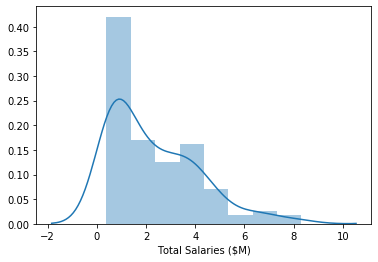

In [52]:
sns.distplot(data.TotalPay.dropna().div(1e6), axlabel="Total Salaries ($M)")
plt.show

In [53]:
import statsmodels.api as sm
ols_conf_fit = sm.OLS.from_formula("standardize(TotalPay) ~ " + \
                                "standardize(StadiumCapacity) + " + \
                                "standardize(Bonus) + " + \
                                  "Conference",
                             data=data.drop(columns='BonusPaid').dropna()).fit()
ols_conf_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     standardize(TotalPay)   R-squared:                       0.704
Model:                               OLS   Adj. R-squared:                  0.669
Method:                    Least Squares   F-statistic:                     19.83
Date:                   Fri, 24 Jan 2020   Prob (F-statistic):           2.27e-21
Time:                           20:56:53   Log-Likelihood:                -91.543
No. Observations:                    113   AIC:                             209.1
Df Residuals:                        100   BIC:                             244.5
Df Model:                             12                                         
Covariance Type:               nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                       -0.4120      0.207     -1.995      0.049      -0.822      -0.002
Conference[T.ACC]                1.0064      0.265      3.794      0.000       0.480       1.533
Conference[T.Big 12]             1.3839      0.286      4.846      0.000       0.817       1.950
Conference[T.Big Ten]            1.4714      0.278      5.288      0.000       0.919       2.024
Conference[T.C-USA]             -0.4080      0.270     -1.514      0.133      -0.943       0.127
Conference[T.Ind.]              -0.5504      0.394     -1.397      0.165      -1.332       0.231
Conference[T.MAC]               -0.5631      0.265     -2.126      0.036      -1.089      -0.038
Conference[T.Mt. West]          -0.2971      0.270     -1.100      0.274      -0.833       0.239
Conference[T.Pac-12]             0.7701      0.275      2.800      0.006       0.224       1.316
Conference[T.SEC]                1.6393      0.274      5.979      0.000       1.095       2.183
Conference[T.Sun Belt]          -0.5175      0.268     -1.933      0.056      -1.049       0.014
standardize(StadiumCapacity)     0.0045      0.058      0.078      0.938      -0.110       0.119
standardize(Bonus)              -0.0418      0.065     -0.643      0.522      -0.171       0.087
==============================================================================
Omnibus:                       30.001   Durbin-Watson:                   1.571
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               73.144
Skew:                           0.987   Prob(JB):                     1.31e-16
Kurtosis:                       6.411   Cond. No.                         13.7
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [54]:
ols_conf_fit.params

Intercept                      -0.411978
Conference[T.ACC]               1.006407
Conference[T.Big 12]            1.383851
Conference[T.Big Ten]           1.471444
Conference[T.C-USA]            -0.408040
Conference[T.Ind.]             -0.550446
Conference[T.MAC]              -0.563118
Conference[T.Mt. West]         -0.297103
Conference[T.Pac-12]            0.770103
Conference[T.SEC]               1.639341
Conference[T.Sun Belt]         -0.517548
standardize(StadiumCapacity)    0.004495
standardize(Bonus)             -0.041829
dtype: float64

C:\Users\jmonroe1\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\jmonroe1\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


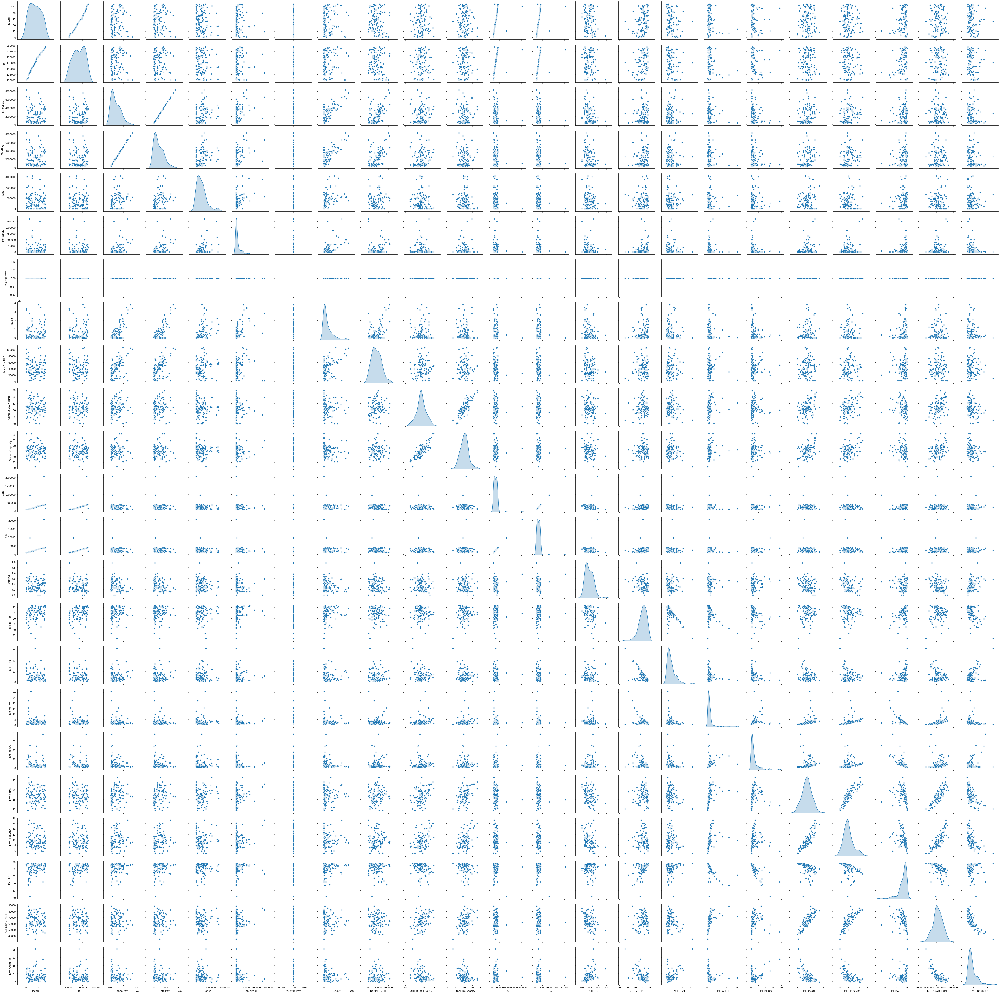

In [55]:
sns.pairplot(data, diag_kind='kde')
plt.savefig('pairs.png')

In [56]:
#sns.boxplot(x="TotalPay", y="Conference", data=data, color = "gray")

In [57]:
#sns.boxplot(x="PCT_BLACK", y="School", data=data, color = "blue", dodge=False)

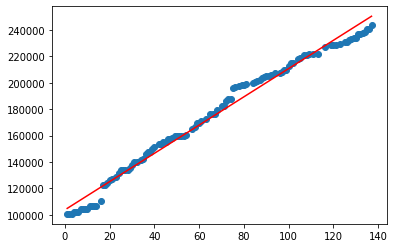

In [58]:
X = data.iloc[:, 0].values.reshape(-1, 1)  # values converts it into a numpy array
Y = data.iloc[:, 1].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column
linear_regressor = LinearRegression()  # create object for the class
linear_regressor.fit(X, Y)  # perform linear regression
Y_pred = linear_regressor.predict(X)  # make predictions

plt.scatter(X, Y)
plt.plot(X, Y_pred, color='red')
plt.show()

In [59]:

missing = pd.concat([data, raw_data]).loc[data.index.symmetric_difference(raw_data.index)]
print(missing)


record      ID              School Conference            Coach  \
14       15  110486          California     Pac-12    Justin Wilcox   
21       22  128328           Air Force   Mt. West     Troy Calhoun   
32       33  139940       Georgia State   Sun Belt    Shawn Elliott   
40       41  152080          Notre Dame       Ind.      Brian Kelly   
54       55  163046            Maryland    Big Ten        DJ Durkin   
55       56  164155               NaNvy        AAC  Ken Niumatalolo   
61       62  171128            Michigan    Big Ten     Jim Harbaugh   
63       64  174358           Minnesota    Big Ten       P.J. Fleck   
68       69  181394            Nebraska    Big Ten      Scott Frost   
76       77  197036                Army       Ind.      Jeff Monken   
81       82  199139           Charlotte      C-USA     Brad Lambert   
82       83  199218      North Carolina        ACC     Larry Fedora   
92       93  207388            Oklahoma     Big 12    Lincoln Riley   
94       95

In [60]:
syr = data.loc[data['School'] == 'Syracuse' ]
syr_hat = ols_conf_fit.predict(syr)
tmp_sal = data.drop(columns="Bonus").dropna().TotalPay
print('${:,.2f}'.format(((syr_hat * tmp_sal.std())+tmp_sal.mean()).values[0]))
#The recommendation for a Salary for Syracuse is:

$3,443,006.30
